In [1]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.linear_model import LinearRegression
from sklearn.cluster import KMeans
from mpl_point_clicker import clicker


/home/daniel/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/least_angle.py:35: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  eps=np.finfo(np.float).eps,
/home/daniel/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/least_angle.py:597: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  eps=np.finfo(np.float).eps, copy_X=Tr

In [2]:
# Cargar los datos de los brazos espirales adicionales
arm1_data = pd.read_csv('../DATA/processed/TracingPoints/arm_tracing_11_arm1_rho_dani.csv')
arm2_data = pd.read_csv('../DATA/processed/TracingPoints/arm_tracing_11_arm2_rho_dani.csv')
data = pd.read_csv('../DATA/processed/TracingPoints/data_rho_11_filtered.csv')

# Calcular las coordenadas polares r y theta para cada conjunto de datos
data['r'] = np.sqrt(data['x']**2 + data['y']**2)
data['theta1'] = (180 * np.arctan2(data['y'], data['x']) / np.pi) - 360
data['theta2'] = (180 * np.arctan2(data['y'], data['x']) / np.pi)

arm1_data['r'] = np.sqrt(arm1_data['x']**2 + arm1_data['y']**2)
arm1_data['theta'] = (180 * np.arctan2(arm1_data['y'], arm1_data['x']) / np.pi) - 360

arm2_data['r'] = np.sqrt(arm2_data['x']**2 + arm2_data['y']**2)
arm2_data['theta'] = (180 * np.arctan2(arm2_data['y'], arm2_data['x']) / np.pi) - 360



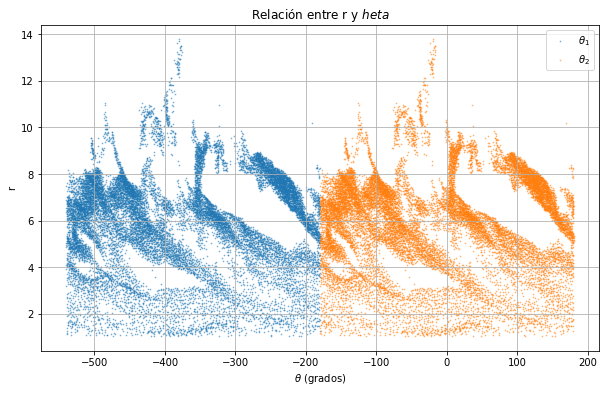

In [3]:
# Calcular las coordenadas polares r y theta
data['r'] = np.sqrt(data['x']**2 + data['y']**2)

# Calcular las variaciones de theta
data['theta1'] = (180 * np.arctan2(data['y'], data['x']) / np.pi) - 360
data['theta2'] = (180 * np.arctan2(data['y'], data['x']) / np.pi)


# Calcular las coordenadas polares r y theta
data['r'] = np.sqrt(data['x']**2 + data['y']**2)

# Calcular las variaciones de theta
data['theta1'] = (180 * np.arctan2(data['y'], data['x']) / np.pi) - 360
data['theta2'] = (180 * np.arctan2(data['y'], data['x']) / np.pi)

# Graficar theta1 y theta2 en la misma gráfica
plt.figure(figsize=(10, 6))

# Graficar theta1
plt.scatter(data['theta1'], data['r'], alpha=0.5, s=0.50, label=r'$\theta_1$')
# Graficar theta2
plt.scatter(data['theta2'], data['r'], alpha=0.5, s=0.50, label=r'$\theta_2$')

# Configurar la gráfica
plt.title('Relación entre r y $\theta$')
plt.xlabel(r'$\theta$ (grados)')
plt.ylabel('r')
plt.legend()
plt.grid(True)

# Mostrar la gráfica
plt.show()

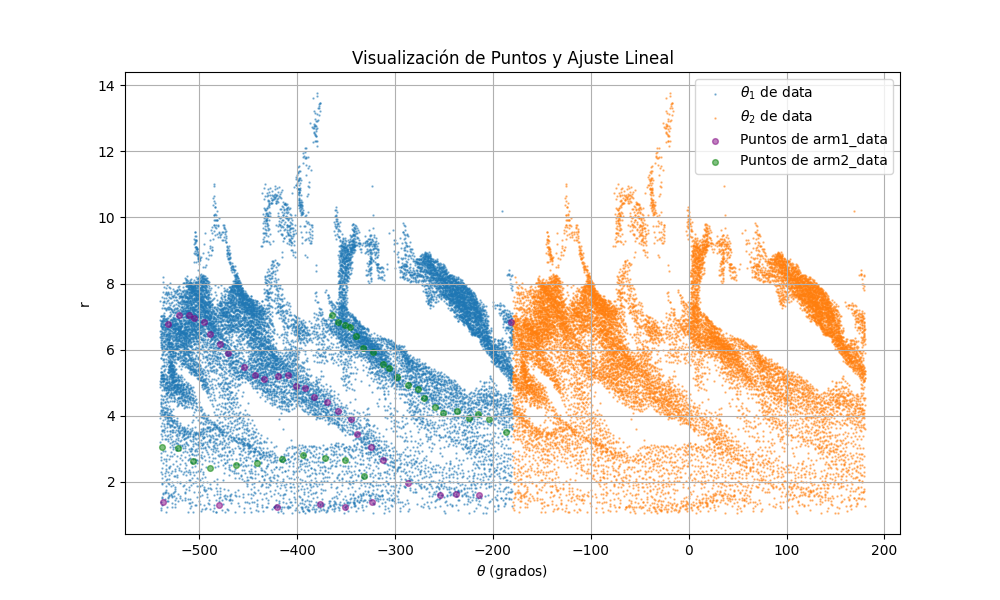

In [10]:
# Visualizar los puntos de fondo y los puntos seleccionados para el ajuste
fig, ax = plt.subplots(figsize=(10, 6))

# Graficar todos los puntos de data
ax.scatter(data['theta1'], data['r'], alpha=0.5, s=0.5, label=r'$\theta_1$ de data')
ax.scatter(data['theta2'], data['r'], alpha=0.5, s=0.5, label=r'$\theta_2$ de data')

# Graficar arm1_data y arm2_data como puntos de fondo
ax.scatter(arm1_data['theta'], arm1_data['r'], color='purple', alpha=0.5, s=17, label='Puntos de arm1_data')
ax.scatter(arm2_data['theta'], arm2_data['r'], color='green', alpha=0.5, s=17, label='Puntos de arm2_data')

ax.set_title('Visualización de Puntos y Ajuste Lineal')
ax.set_xlabel(r'$\theta$ (grados)')
ax.set_ylabel('r')
ax.legend()
plt.grid(True)
plt.show()


In [11]:
# Crear nuevos DataFrames para theta1 y theta2 con sus respectivos valores de r
data_theta1 = pd.DataFrame({'theta': data['theta1'], 'r': data['r']})
data_theta2 = pd.DataFrame({'theta': data['theta2'], 'r': data['r']})


# Concatenar ambos DataFrames
data_combined = pd.concat([data_theta1, data_theta2], ignore_index=True)

data_combined.head(2)

,theta,r
0,-249.374835,1.061656
1,-249.850758,1.114999


## brazo 1

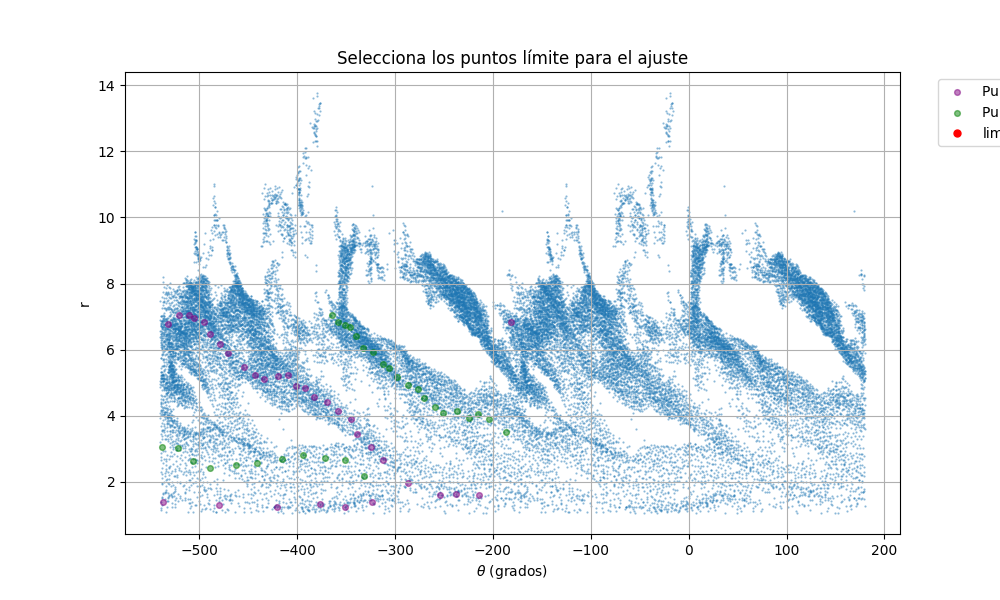

In [22]:
id_arm = 1
%matplotlib widget

# Visualizar los puntos y permitir la selección manual
fig, ax = plt.subplots(figsize=(10, 6))
scatter = ax.scatter(data_combined['theta'], data_combined['r'], s=0.30, alpha=0.5)
ax.set_title("Selecciona los puntos límite para el ajuste")
ax.set_xlabel(r'$\theta$ (grados)')
# Graficar arm1_data y arm2_data como puntos de fondo
ax.scatter(arm1_data['theta'], arm1_data['r'], color='purple', alpha=0.5, s=17, label='Puntos de arm1_data')
ax.scatter(arm2_data['theta'], arm2_data['r'], color='green', alpha=0.5, s=17, label='Puntos de arm2_data')

ax.set_ylabel('r')
plt.grid(True)

# Usar mpl_point_clicker para seleccionar los límites
klicker = clicker(ax, ["limits"], markers=["o"], colors=['red'], markersize=5)

plt.show()

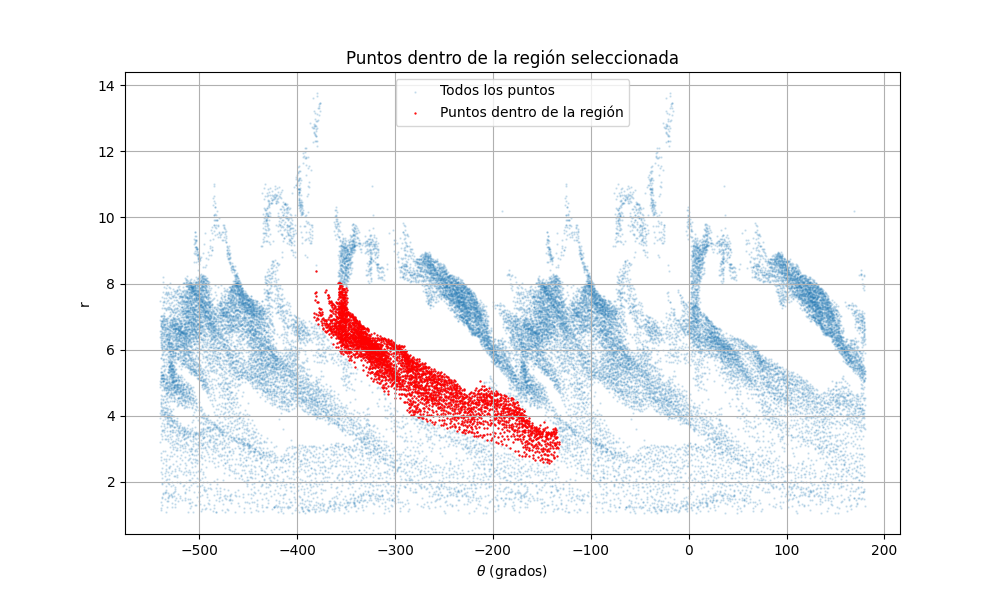

In [16]:
from matplotlib.path import Path

# Obtener los límites seleccionados
dict_lims = klicker.get_positions()

# Revisar si se seleccionaron al menos tres puntos para formar una región cerrada
if "limits" in dict_lims and len(dict_lims["limits"]) >= 3:
    # Crear un Path (camino) a partir de los puntos seleccionados
    polygon_path = Path(dict_lims["limits"])
    
    # Filtrar los puntos que están dentro del polígono seleccionado
    inside_points = []
    for i in range(len(data_combined)):
        point = (data_combined['theta'].iloc[i], data_combined['r'].iloc[i])
        if polygon_path.contains_point(point):
            inside_points.append(point)

    # Convertir los puntos seleccionados a DataFrame
    selected_data = pd.DataFrame(inside_points, columns=['theta', 'r'])

    # Graficar los puntos dentro de la región seleccionada
    plt.figure(figsize=(10, 6))
    plt.scatter(data_combined['theta'], data_combined['r'], s=0.40, alpha=0.2, label='Todos los puntos')
    plt.scatter(selected_data['theta'], selected_data['r'], color='red', s=0.40, label='Puntos dentro de la región')
    plt.title("Puntos dentro de la región seleccionada")
    plt.xlabel(r'$\theta$ (grados)')
    plt.ylabel('r')
    plt.legend()
    plt.grid(True)
    plt.show()
else:
    print("Selecciona al menos tres puntos para definir una región cerrada.")

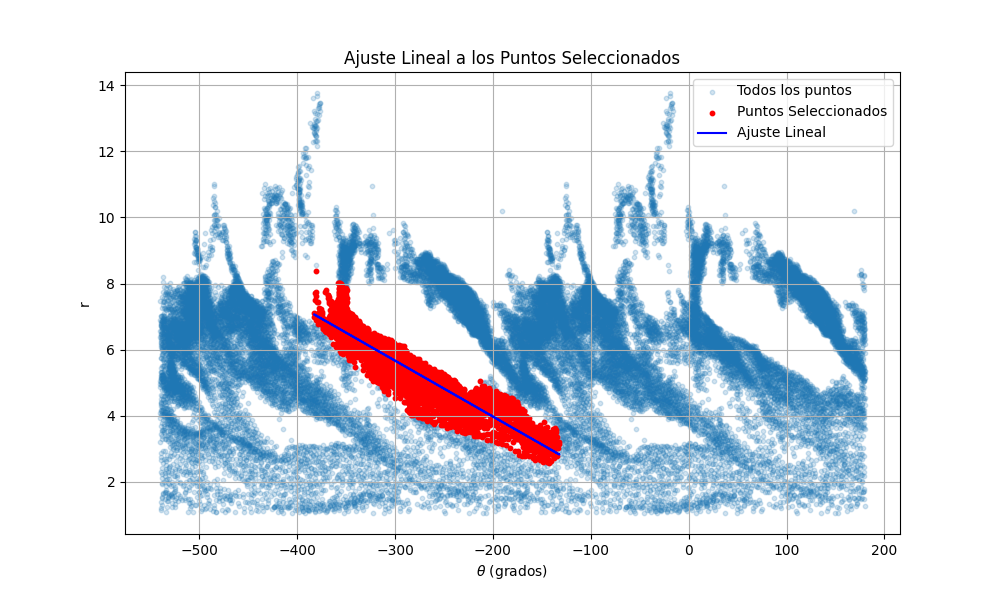

Ecuación de la recta ajustada: r = -0.0169 * θ + 0.5866


In [17]:
# Obtener los límites seleccionados
dict_lims = klicker.get_positions()

# Revisar si se seleccionaron al menos tres puntos para formar una región cerrada
if "limits" in dict_lims and len(dict_lims["limits"]) >= 3:
    # Crear un Path (camino) a partir de los puntos seleccionados
    polygon_path = Path(dict_lims["limits"])
    
    # Filtrar los puntos que están dentro del polígono seleccionado
    inside_points = []
    original_coords = []  # Lista para almacenar las coordenadas originales seleccionadas
    for i in range(len(data_combined)):
        point = (data_combined['theta'].iloc[i], data_combined['r'].iloc[i])
        if polygon_path.contains_point(point):
            inside_points.append(point)
            # Guardar las coordenadas originales en `x` e `y` para la gráfica polar
            original_coords.append((data['x'].iloc[i % len(data)], data['y'].iloc[i % len(data)]))

    # Convertir los puntos seleccionados a DataFrame
    selected_data = pd.DataFrame(inside_points, columns=['theta', 'r'])

    # Realizar ajuste lineal
    if len(selected_data) > 1:
        X_selected = selected_data[['theta']].values
        y_selected = selected_data['r'].values

        # Ajuste lineal
        model = LinearRegression()
        model.fit(X_selected, y_selected)
        slope = model.coef_[0]
        intercept = model.intercept_
        y_pred = model.predict(X_selected)

        # Graficar los puntos seleccionados, la línea ajustada y el fondo
        plt.figure(figsize=(10, 6))
        plt.scatter(data_combined['theta'], data_combined['r'], s=10, alpha=0.2, label='Todos los puntos')
        plt.scatter(selected_data['theta'], selected_data['r'], color='red', s=10, label='Puntos Seleccionados')
        plt.plot(selected_data['theta'], y_pred, color='blue', label='Ajuste Lineal')
        plt.title("Ajuste Lineal a los Puntos Seleccionados")
        plt.xlabel(r'$\theta$ (grados)')
        plt.ylabel('r')
        plt.legend()
        plt.grid(True)
        plt.show()

        # Mostrar la ecuación de la recta
        print(f"Ecuación de la recta ajustada: r = {slope:.4f} * θ + {intercept:.4f}")
    else:
        print("Selecciona más puntos para realizar el ajuste.")
else:
    print("Selecciona al menos tres puntos para definir una región cerrada.")



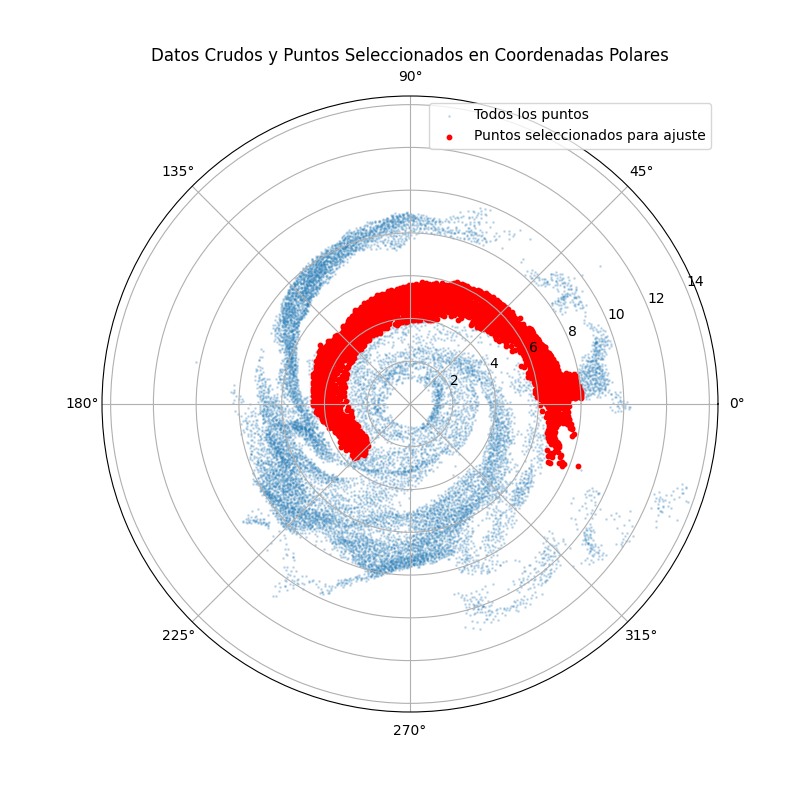

In [18]:
# Extraer las coordenadas originales x e y de los puntos seleccionados
selected_x = [coord[0] for coord in original_coords]
selected_y = [coord[1] for coord in original_coords]

# Configurar la gráfica en coordenadas polares
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(8, 8))

# Graficar todos los puntos en coordenadas polares
theta_all = np.arctan2(data['y'], data['x'])
r_all = np.sqrt(data['x']**2 + data['y']**2)
ax.scatter(theta_all, r_all, s=1, alpha=0.2, label="Todos los puntos")

# Graficar solo los puntos seleccionados en rojo
theta_selected = np.arctan2(selected_y, selected_x)
r_selected = np.sqrt(np.array(selected_x)**2 + np.array(selected_y)**2)
ax.scatter(theta_selected, r_selected, color='red', s=10, label="Puntos seleccionados para ajuste")

# Configuración de la gráfica
ax.set_title("Datos Crudos y Puntos Seleccionados en Coordenadas Polares")
ax.legend()
plt.show()


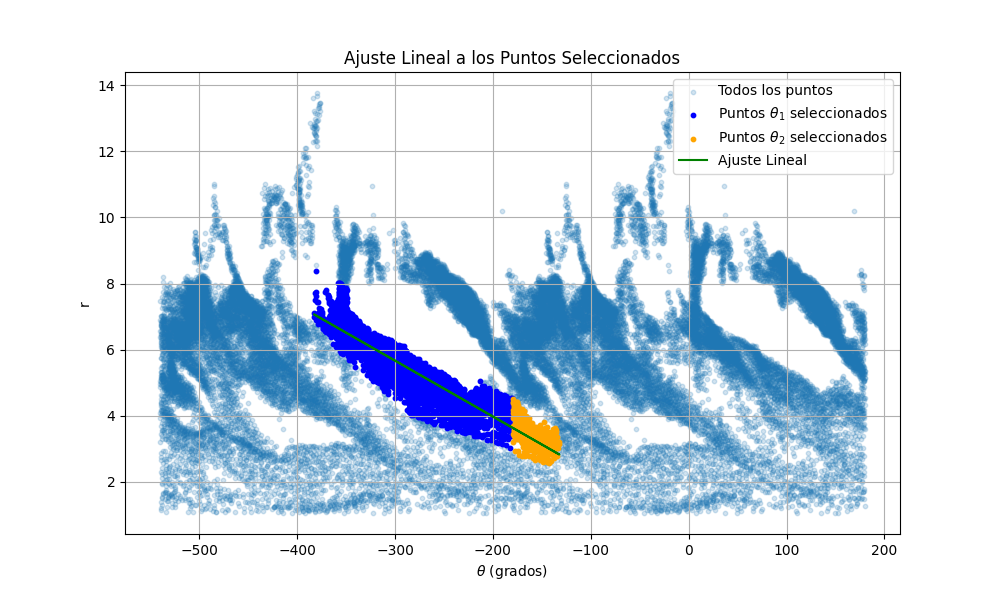

Ecuación de la recta ajustada: r = -0.0169 * θ + 0.5866


In [19]:
# Obtener los límites seleccionados
dict_lims = klicker.get_positions()

# Revisar si se seleccionaron al menos tres puntos para formar una región cerrada
if "limits" in dict_lims and len(dict_lims["limits"]) >= 3:
    # Crear un Path (camino) a partir de los puntos seleccionados
    polygon_path = Path(dict_lims["limits"])
    
    # Filtrar los puntos que están dentro del polígono seleccionado
    inside_points_theta1 = []
    inside_points_theta2 = []
    original_coords_theta1 = []  # Para almacenar las coordenadas originales de theta1
    original_coords_theta2 = []  # Para almacenar las coordenadas originales de theta2
    
    # Iterar sobre los puntos de theta1
    for i in range(len(data_theta1)):
        point = (data_theta1['theta'].iloc[i], data_theta1['r'].iloc[i])
        if polygon_path.contains_point(point):
            inside_points_theta1.append(point)
            original_coords_theta1.append((data['x'].iloc[i], data['y'].iloc[i]))

    # Iterar sobre los puntos de theta2
    for i in range(len(data_theta2)):
        point = (data_theta2['theta'].iloc[i], data_theta2['r'].iloc[i])
        if polygon_path.contains_point(point):
            inside_points_theta2.append(point)
            original_coords_theta2.append((data['x'].iloc[i], data['y'].iloc[i]))

    # Convertir los puntos seleccionados a DataFrame
    selected_data_theta1 = pd.DataFrame(inside_points_theta1, columns=['theta', 'r'])
    selected_data_theta2 = pd.DataFrame(inside_points_theta2, columns=['theta', 'r'])

    # Concatenar ambos para el ajuste lineal (si quieres usar todos los puntos seleccionados)
    selected_data = pd.concat([selected_data_theta1, selected_data_theta2], ignore_index=True)

    # Realizar ajuste lineal
    if len(selected_data) > 1:
        X_selected = selected_data[['theta']].values
        y_selected = selected_data['r'].values

        # Ajuste lineal
        model = LinearRegression()
        model.fit(X_selected, y_selected)
        slope = model.coef_[0]
        intercept = model.intercept_
        y_pred = model.predict(X_selected)

        # Graficar los puntos seleccionados, la línea ajustada y el fondo
        plt.figure(figsize=(10, 6))
        plt.scatter(data_combined['theta'], data_combined['r'], s=10, alpha=0.2, label='Todos los puntos')
        plt.scatter(selected_data_theta1['theta'], selected_data_theta1['r'], color='blue', s=10, label=r'Puntos $\theta_1$ seleccionados')
        plt.scatter(selected_data_theta2['theta'], selected_data_theta2['r'], color='orange', s=10, label=r'Puntos $\theta_2$ seleccionados')
        plt.plot(selected_data['theta'], y_pred, color='green', label='Ajuste Lineal')
        plt.title("Ajuste Lineal a los Puntos Seleccionados")
        plt.xlabel(r'$\theta$ (grados)')
        plt.ylabel('r')
        plt.legend()
        plt.grid(True)
        plt.show()

        # Mostrar la ecuación de la recta
        print(f"Ecuación de la recta ajustada: r = {slope:.4f} * θ + {intercept:.4f}")
    else:
        print("Selecciona más puntos para realizar el ajuste.")
else:
    print("Selecciona al menos tres puntos para definir una región cerrada.")


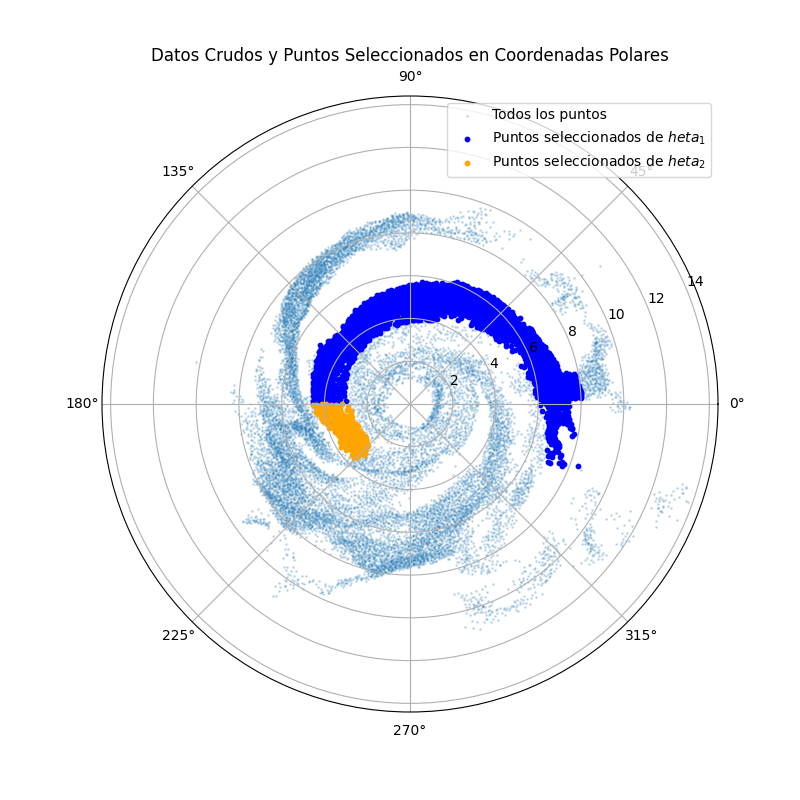

In [20]:
# Extraer las coordenadas originales x e y de los puntos seleccionados
selected_x_theta1 = [coord[0] for coord in original_coords_theta1]
selected_y_theta1 = [coord[1] for coord in original_coords_theta1]
selected_x_theta2 = [coord[0] for coord in original_coords_theta2]
selected_y_theta2 = [coord[1] for coord in original_coords_theta2]

# Configurar la gráfica en coordenadas polares
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(8, 8))

# Graficar todos los puntos en coordenadas polares
theta_all = np.arctan2(data['y'], data['x'])
r_all = np.sqrt(data['x']**2 + data['y']**2)
ax.scatter(theta_all, r_all, s=1, alpha=0.2, label="Todos los puntos")

# Graficar los puntos seleccionados de theta1 en azul
theta_selected_theta1 = np.arctan2(selected_y_theta1, selected_x_theta1)
r_selected_theta1 = np.sqrt(np.array(selected_x_theta1)**2 + np.array(selected_y_theta1)**2)
ax.scatter(theta_selected_theta1, r_selected_theta1, color='blue', s=10, label="Puntos seleccionados de $\theta_1$")

# Graficar los puntos seleccionados de theta2 en naranja
theta_selected_theta2 = np.arctan2(selected_y_theta2, selected_x_theta2)
r_selected_theta2 = np.sqrt(np.array(selected_x_theta2)**2 + np.array(selected_y_theta2)**2)
ax.scatter(theta_selected_theta2, r_selected_theta2, color='orange', s=10, label="Puntos seleccionados de $\theta_2$")

# Configuración de la gráfica
ax.set_title("Datos Crudos y Puntos Seleccionados en Coordenadas Polares")
ax.legend()
plt.show()


## brazo 2

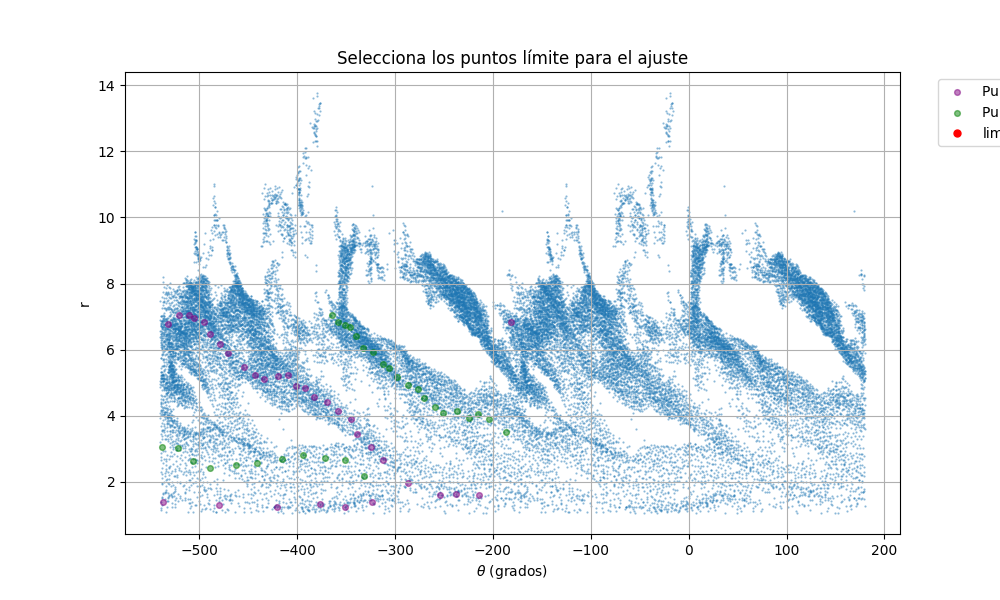

In [23]:
id_arm = 2
%matplotlib widget

# Visualizar los puntos y permitir la selección manual
fig, ax = plt.subplots(figsize=(10, 6))
scatter = ax.scatter(data_combined['theta'], data_combined['r'], s=0.30, alpha=0.5)
ax.set_title("Selecciona los puntos límite para el ajuste")
ax.set_xlabel(r'$\theta$ (grados)')
# Graficar arm1_data y arm2_data como puntos de fondo
ax.scatter(arm1_data['theta'], arm1_data['r'], color='purple', alpha=0.5, s=17, label='Puntos de arm1_data')
ax.scatter(arm2_data['theta'], arm2_data['r'], color='green', alpha=0.5, s=17, label='Puntos de arm2_data')

ax.set_ylabel('r')
plt.grid(True)

# Usar mpl_point_clicker para seleccionar los límites
klicker = clicker(ax, ["limits"], markers=["o"], colors=['red'], markersize=5)

plt.show()

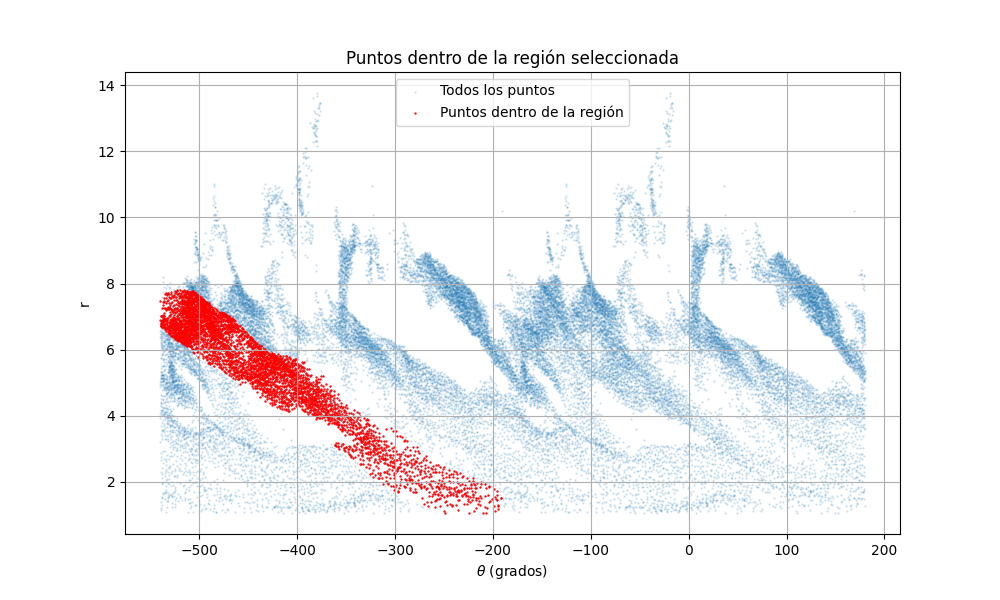

In [24]:
from matplotlib.path import Path

# Obtener los límites seleccionados
dict_lims = klicker.get_positions()

# Revisar si se seleccionaron al menos tres puntos para formar una región cerrada
if "limits" in dict_lims and len(dict_lims["limits"]) >= 3:
    # Crear un Path (camino) a partir de los puntos seleccionados
    polygon_path = Path(dict_lims["limits"])
    
    # Filtrar los puntos que están dentro del polígono seleccionado
    inside_points = []
    for i in range(len(data_combined)):
        point = (data_combined['theta'].iloc[i], data_combined['r'].iloc[i])
        if polygon_path.contains_point(point):
            inside_points.append(point)

    # Convertir los puntos seleccionados a DataFrame
    selected_data = pd.DataFrame(inside_points, columns=['theta', 'r'])

    # Graficar los puntos dentro de la región seleccionada
    plt.figure(figsize=(10, 6))
    plt.scatter(data_combined['theta'], data_combined['r'], s=0.40, alpha=0.2, label='Todos los puntos')
    plt.scatter(selected_data['theta'], selected_data['r'], color='red', s=0.40, label='Puntos dentro de la región')
    plt.title("Puntos dentro de la región seleccionada")
    plt.xlabel(r'$\theta$ (grados)')
    plt.ylabel('r')
    plt.legend()
    plt.grid(True)
    plt.show()
else:
    print("Selecciona al menos tres puntos para definir una región cerrada.")

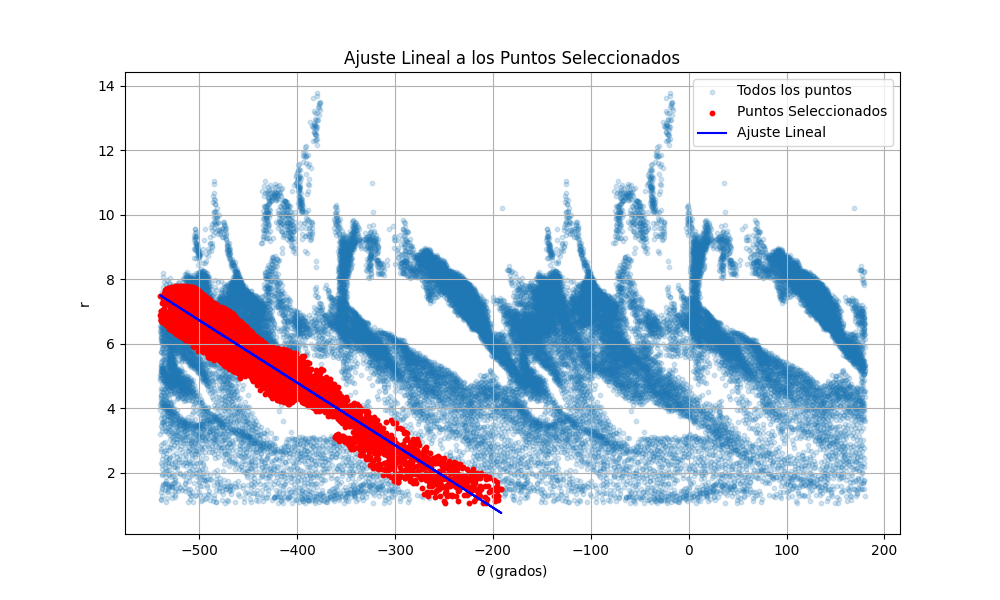

Ecuación de la recta ajustada: r = -0.0194 * θ + -2.9567


In [28]:
# Obtener los límites seleccionados
dict_lims_arm2 = klicker.get_positions()

# Revisar si se seleccionaron al menos tres puntos para formar una región cerrada
if "limits" in dict_lims_arm2 and len(dict_lims_arm2["limits"]) >= 3:
    # Crear un Path (camino) a partir de los puntos seleccionados
    polygon_path = Path(dict_lims_arm2["limits"])
    
    # Filtrar los puntos que están dentro del polígono seleccionado
    inside_points = []
    original_coords = []  # Lista para almacenar las coordenadas originales seleccionadas
    for i in range(len(data_combined)):
        point = (data_combined['theta'].iloc[i], data_combined['r'].iloc[i])
        if polygon_path.contains_point(point):
            inside_points.append(point)
            # Guardar las coordenadas originales en `x` e `y` para la gráfica polar
            original_coords.append((data['x'].iloc[i % len(data)], data['y'].iloc[i % len(data)]))

    # Convertir los puntos seleccionados a DataFrame
    selected_data_arm2 = pd.DataFrame(inside_points, columns=['theta', 'r'])

    # Realizar ajuste lineal
    if len(selected_data_arm2) > 1:
        X_selected = selected_data_arm2[['theta']].values
        y_selected = selected_data_arm2['r'].values

        # Ajuste lineal
        model = LinearRegression()
        model.fit(X_selected, y_selected)
        slope = model.coef_[0]
        intercept = model.intercept_
        y_pred_arm2 = model.predict(X_selected)

        # Graficar los puntos seleccionados, la línea ajustada y el fondo
        plt.figure(figsize=(10, 6))
        plt.scatter(data_combined['theta'], data_combined['r'], s=10, alpha=0.2, label='Todos los puntos')
        plt.scatter(selected_data_arm2['theta'], selected_data_arm2['r'], color='red', s=10, label='Puntos Seleccionados')
        plt.plot(selected_data_arm2['theta'], y_pred_arm2, color='blue', label='Ajuste Lineal')
        plt.title("Ajuste Lineal a los Puntos Seleccionados")
        plt.xlabel(r'$\theta$ (grados)')
        plt.ylabel('r')
        plt.legend()
        plt.grid(True)
        plt.show()

        # Mostrar la ecuación de la recta
        print(f"Ecuación de la recta ajustada: r = {slope:.4f} * θ + {intercept:.4f}")
    else:
        print("Selecciona más puntos para realizar el ajuste.")
else:
    print("Selecciona al menos tres puntos para definir una región cerrada.")


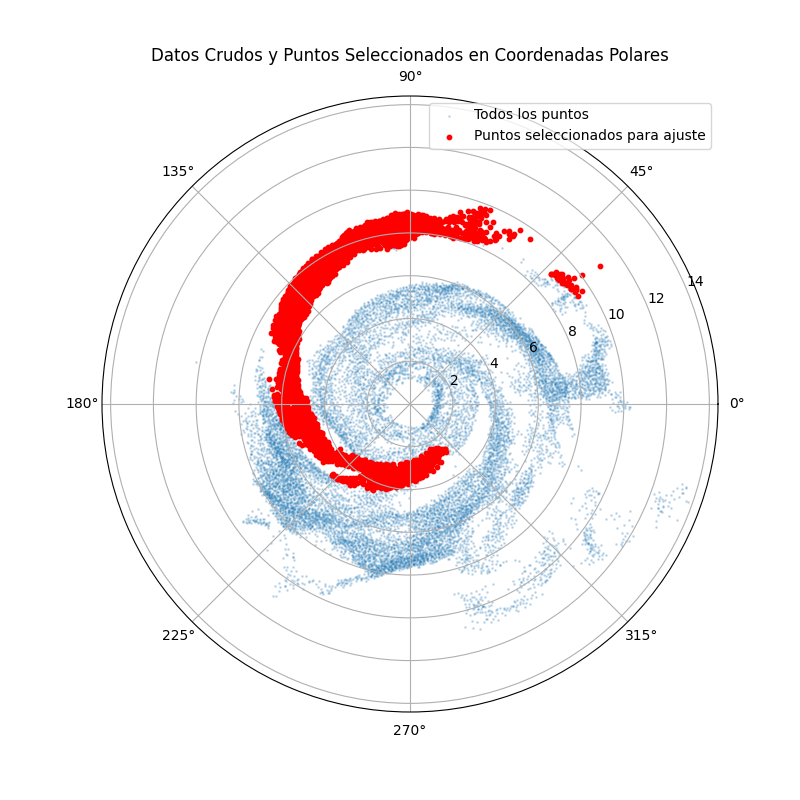

In [40]:
# Extraer las coordenadas originales x e y de los puntos seleccionados
selected_x = [coord[0] for coord in original_coords]
selected_y = [coord[1] for coord in original_coords]

# Configurar la gráfica en coordenadas polares
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(8, 8))

# Graficar todos los puntos en coordenadas polares
theta_all = np.arctan2(data['y'], data['x'])
r_all = np.sqrt(data['x']**2 + data['y']**2)
ax.scatter(theta_all, r_all, s=1, alpha=0.2, label="Todos los puntos")

# Graficar solo los puntos seleccionados en rojo
theta_selected_arm_2 = np.arctan2(selected_y, selected_x)
r_selected_arm_2 = np.sqrt(np.array(selected_x)**2 + np.array(selected_y)**2)
ax.scatter(theta_selected_arm_2, r_selected_arm_2, color='red', s=10, label="Puntos seleccionados para ajuste")

# Configuración de la gráfica
ax.set_title("Datos Crudos y Puntos Seleccionados en Coordenadas Polares")
ax.legend()
plt.show()

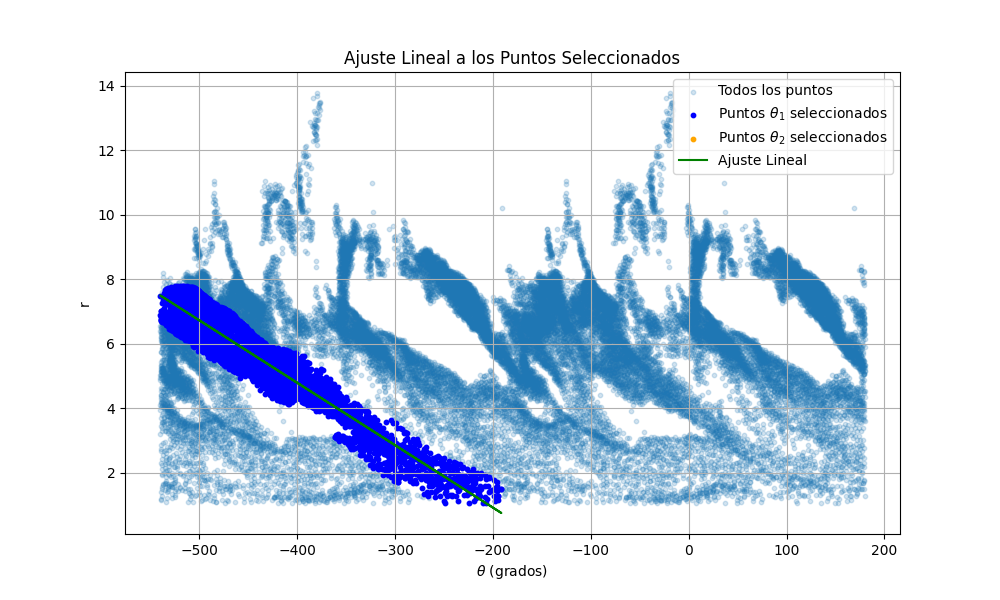

Ecuación de la recta ajustada: r = -0.0194 * θ + -2.9567


In [32]:
# Obtener los límites seleccionados
dict_lims = klicker.get_positions()

# Revisar si se seleccionaron al menos tres puntos para formar una región cerrada
if "limits" in dict_lims and len(dict_lims["limits"]) >= 3:
    # Crear un Path (camino) a partir de los puntos seleccionados
    polygon_path = Path(dict_lims["limits"])
    
    # Filtrar los puntos que están dentro del polígono seleccionado
    inside_points_theta1 = []
    inside_points_theta2 = []
    original_coords_theta1 = []  # Para almacenar las coordenadas originales de theta1
    original_coords_theta2 = []  # Para almacenar las coordenadas originales de theta2
    
    # Iterar sobre los puntos de theta1
    for i in range(len(data_theta1)):
        point = (data_theta1['theta'].iloc[i], data_theta1['r'].iloc[i])
        if polygon_path.contains_point(point):
            inside_points_theta1.append(point)
            original_coords_theta1.append((data['x'].iloc[i], data['y'].iloc[i]))

    # Iterar sobre los puntos de theta2
    for i in range(len(data_theta2)):
        point = (data_theta2['theta'].iloc[i], data_theta2['r'].iloc[i])
        if polygon_path.contains_point(point):
            inside_points_theta2.append(point)
            original_coords_theta2.append((data['x'].iloc[i], data['y'].iloc[i]))

    # Convertir los puntos seleccionados a DataFrame
    # Convertir los puntos seleccionados de theta1 a DataFrame solo si hay puntos
    if inside_points_theta1:
        selected_data_theta1 = pd.DataFrame(inside_points_theta1, columns=['theta', 'r'])
    else:
        selected_data_theta1 = pd.DataFrame({'theta': pd.Series(dtype='float64'), 
                                             'r': pd.Series(dtype='float64')})  # Crear un DataFrame vacío con las columnas necesarias

    # Convertir los puntos seleccionados de theta2 a DataFrame solo si hay puntos
    if inside_points_theta2:
        selected_data_theta2 = pd.DataFrame(inside_points_theta2, columns=['theta', 'r'])
    else:
        selected_data_theta2 = pd.DataFrame({'theta': pd.Series(dtype='float64'), 
                                             'r': pd.Series(dtype='float64')})  # Crear un DataFrame vacío con las columnas necesarias

    # Concatenar ambos para el ajuste lineal (si quieres usar todos los puntos seleccionados)
    selected_data = pd.concat([selected_data_theta1, selected_data_theta2], ignore_index=True)

    # Realizar ajuste lineal
    if len(selected_data) > 1:
        X_selected = selected_data[['theta']].values
        y_selected = selected_data['r'].values

        # Ajuste lineal
        model = LinearRegression()
        model.fit(X_selected, y_selected)
        slope = model.coef_[0]
        intercept = model.intercept_
        y_pred = model.predict(X_selected)

        # Graficar los puntos seleccionados, la línea ajustada y el fondo
        plt.figure(figsize=(10, 6))
        plt.scatter(data_combined['theta'], data_combined['r'], s=10, alpha=0.2, label='Todos los puntos')
        plt.scatter(selected_data_theta1['theta'], selected_data_theta1['r'], color='blue', s=10, label=r'Puntos $\theta_1$ seleccionados')
        plt.scatter(selected_data_theta2['theta'], selected_data_theta2['r'], color='orange', s=10, label=r'Puntos $\theta_2$ seleccionados')
        plt.plot(selected_data['theta'], y_pred, color='green', label='Ajuste Lineal')
        plt.title("Ajuste Lineal a los Puntos Seleccionados")
        plt.xlabel(r'$\theta$ (grados)')
        plt.ylabel('r')
        plt.legend()
        plt.grid(True)
        plt.show()

        # Mostrar la ecuación de la recta
        print(f"Ecuación de la recta ajustada: r = {slope:.4f} * θ + {intercept:.4f}")
    else:
        print("Selecciona más puntos para realizar el ajuste.")
else:
    print("Selecciona al menos tres puntos para definir una región cerrada.")


## brazo 3

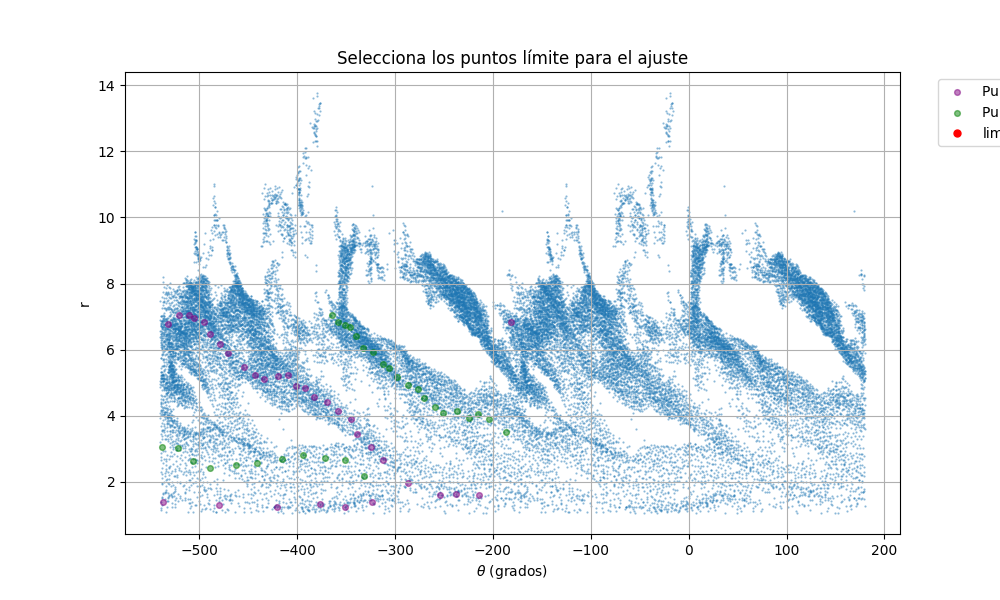

In [33]:
id_arm = 3
%matplotlib widget

# Visualizar los puntos y permitir la selección manual
fig, ax = plt.subplots(figsize=(10, 6))
scatter = ax.scatter(data_combined['theta'], data_combined['r'], s=0.30, alpha=0.5)
ax.set_title("Selecciona los puntos límite para el ajuste")
ax.set_xlabel(r'$\theta$ (grados)')
# Graficar arm1_data y arm2_data como puntos de fondo
ax.scatter(arm1_data['theta'], arm1_data['r'], color='purple', alpha=0.5, s=17, label='Puntos de arm1_data')
ax.scatter(arm2_data['theta'], arm2_data['r'], color='green', alpha=0.5, s=17, label='Puntos de arm2_data')

ax.set_ylabel('r')
plt.grid(True)

# Usar mpl_point_clicker para seleccionar los límites
klicker = clicker(ax, ["limits"], markers=["o"], colors=['red'], markersize=5)

plt.show()

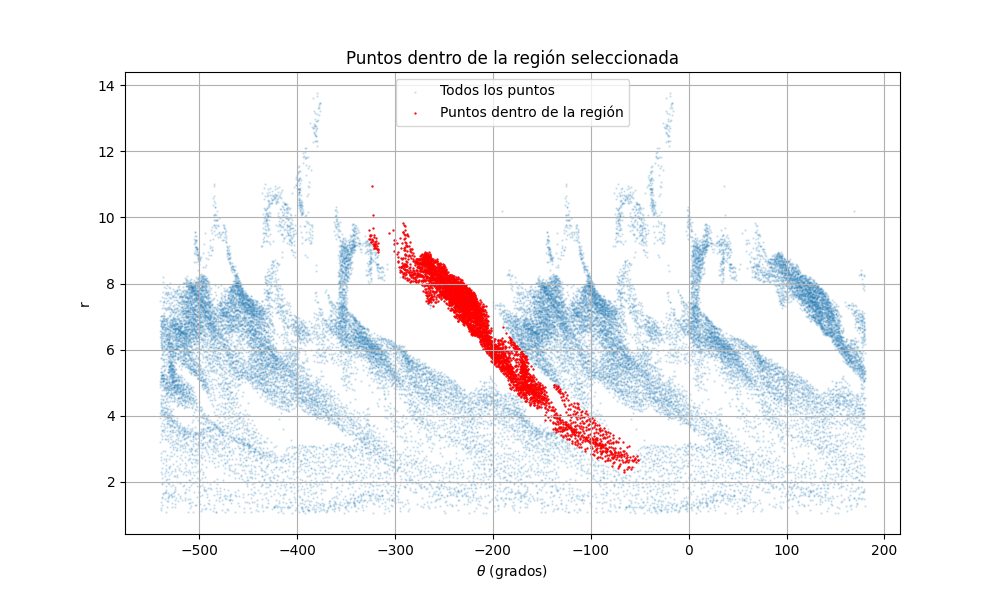

In [34]:
from matplotlib.path import Path

# Obtener los límites seleccionados
dict_lims_arm3 = klicker.get_positions()

# Revisar si se seleccionaron al menos tres puntos para formar una región cerrada
if "limits" in dict_lims_arm3 and len(dict_lims_arm3["limits"]) >= 3:
    # Crear un Path (camino) a partir de los puntos seleccionados
    polygon_path = Path(dict_lims_arm3["limits"])
    
    # Filtrar los puntos que están dentro del polígono seleccionado
    inside_points = []
    for i in range(len(data_combined)):
        point = (data_combined['theta'].iloc[i], data_combined['r'].iloc[i])
        if polygon_path.contains_point(point):
            inside_points.append(point)

    # Convertir los puntos seleccionados a DataFrame
    selected_data = pd.DataFrame(inside_points, columns=['theta', 'r'])

    # Graficar los puntos dentro de la región seleccionada
    plt.figure(figsize=(10, 6))
    plt.scatter(data_combined['theta'], data_combined['r'], s=0.40, alpha=0.2, label='Todos los puntos')
    plt.scatter(selected_data['theta'], selected_data['r'], color='red', s=0.40, label='Puntos dentro de la región')
    plt.title("Puntos dentro de la región seleccionada")
    plt.xlabel(r'$\theta$ (grados)')
    plt.ylabel('r')
    plt.legend()
    plt.grid(True)
    plt.show()
else:
    print("Selecciona al menos tres puntos para definir una región cerrada.")

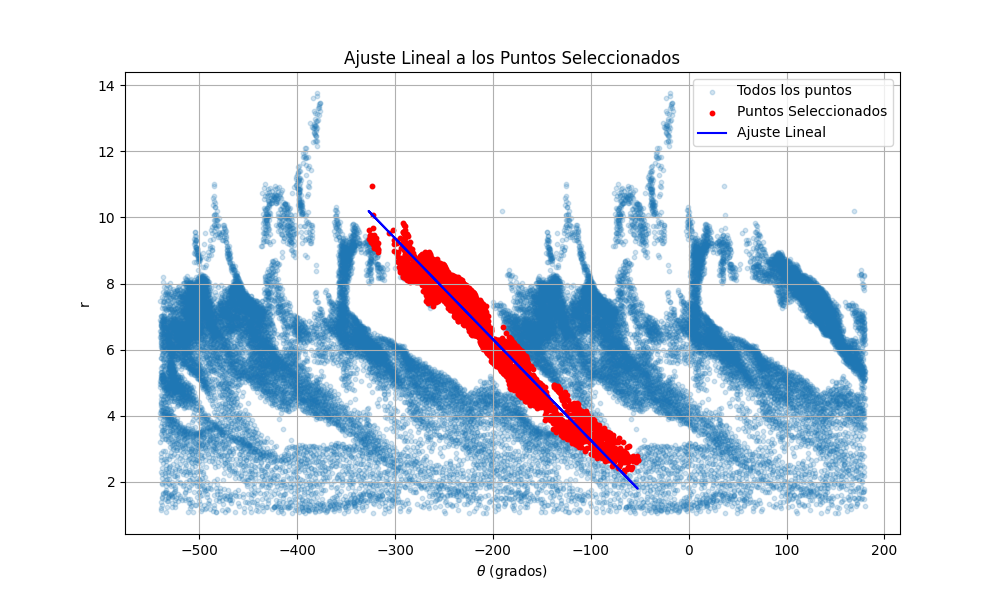

Ecuación de la recta ajustada: r = -0.0306 * θ + 0.1975


In [35]:
# Obtener los límites seleccionados
dict_lims_arm3 = klicker.get_positions()

# Revisar si se seleccionaron al menos tres puntos para formar una región cerrada
if "limits" in dict_lims_arm3 and len(dict_lims_arm3["limits"]) >= 3:
    # Crear un Path (camino) a partir de los puntos seleccionados
    polygon_path = Path(dict_lims_arm3["limits"])
    
    # Filtrar los puntos que están dentro del polígono seleccionado
    inside_points = []
    original_coords = []  # Lista para almacenar las coordenadas originales seleccionadas
    for i in range(len(data_combined)):
        point = (data_combined['theta'].iloc[i], data_combined['r'].iloc[i])
        if polygon_path.contains_point(point):
            inside_points.append(point)
            # Guardar las coordenadas originales en `x` e `y` para la gráfica polar
            original_coords.append((data['x'].iloc[i % len(data)], data['y'].iloc[i % len(data)]))

    # Convertir los puntos seleccionados a DataFrame
    selected_data_arm3 = pd.DataFrame(inside_points, columns=['theta', 'r'])

    # Realizar ajuste lineal
    if len(selected_data_arm3) > 1:
        X_selected = selected_data_arm3[['theta']].values
        y_selected = selected_data_arm3['r'].values

        # Ajuste lineal
        model = LinearRegression()
        model.fit(X_selected, y_selected)
        slope = model.coef_[0]
        intercept = model.intercept_
        y_pred_arm3 = model.predict(X_selected)

        # Graficar los puntos seleccionados, la línea ajustada y el fondo
        plt.figure(figsize=(10, 6))
        plt.scatter(data_combined['theta'], data_combined['r'], s=10, alpha=0.2, label='Todos los puntos')
        plt.scatter(selected_data_arm3['theta'], selected_data_arm3['r'], color='red', s=10, label='Puntos Seleccionados')
        plt.plot(selected_data_arm3['theta'], y_pred_arm3, color='blue', label='Ajuste Lineal')
        plt.title("Ajuste Lineal a los Puntos Seleccionados")
        plt.xlabel(r'$\theta$ (grados)')
        plt.ylabel('r')
        plt.legend()
        plt.grid(True)
        plt.show()

        # Mostrar la ecuación de la recta
        print(f"Ecuación de la recta ajustada: r = {slope:.4f} * θ + {intercept:.4f} para el brazo {id_arm}")
    else:
        print("Selecciona más puntos para realizar el ajuste.")
else:
    print("Selecciona al menos tres puntos para definir una región cerrada.")


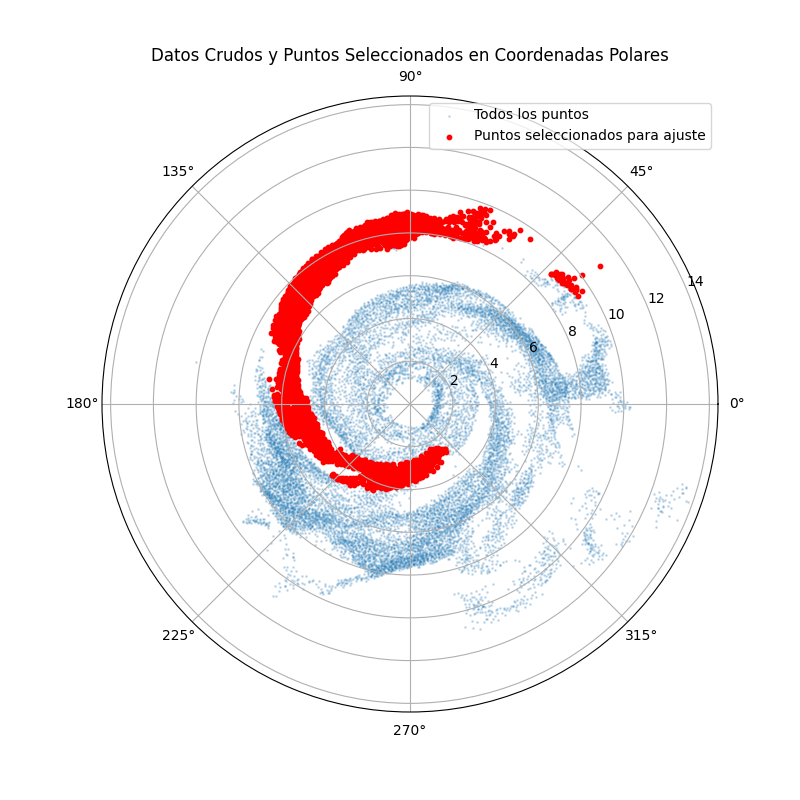

In [41]:
# Extraer las coordenadas originales x e y de los puntos seleccionados
selected_x = [coord[0] for coord in original_coords]
selected_y = [coord[1] for coord in original_coords]

# Configurar la gráfica en coordenadas polares
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(8, 8))

# Graficar todos los puntos en coordenadas polares
theta_all = np.arctan2(data['y'], data['x'])
r_all = np.sqrt(data['x']**2 + data['y']**2)
ax.scatter(theta_all, r_all, s=1, alpha=0.2, label="Todos los puntos")

# Graficar solo los puntos seleccionados en rojo
theta_selected_arm_3 = np.arctan2(selected_y, selected_x)
r_selected_arm_3 = np.sqrt(np.array(selected_x)**2 + np.array(selected_y)**2)
ax.scatter(theta_selected_arm_3, r_selected_arm_3, color='red', s=10, label="Puntos seleccionados para ajuste")

# Configuración de la gráfica
ax.set_title("Datos Crudos y Puntos Seleccionados en Coordenadas Polares")
ax.legend()
plt.show()

In [ ]:
# Crear DataFrames para almacenar los datos de cada brazo
arms_data = {}

def guardar_datos_brazo(selected_x, selected_y, id_arm):
    """Almacenar los datos seleccionados para un brazo específico."""
    theta_selected = np.arctan2(selected_y, selected_x)
    r_selected = np.sqrt(np.array(selected_x)**2 + np.array(selected_y)**2)
    arms_data[f'arm_{id_arm}'] = pd.DataFrame({
        'theta_selected': theta_selected,
        'r_selected': r_selected
    })
    return theta_selected, r_selected

# Extraer las coordenadas originales x e y de los puntos seleccionados para cada brazo
def procesar_brazo(original_coords, id_arm):
    selected_x = [coord[0] for coord in original_coords]
    selected_y = [coord[1] for coord in original_coords]
    theta_selected, r_selected = guardar_datos_brazo(selected_x, selected_y, id_arm)
    
    # Configurar la gráfica en coordenadas polares
    fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(8, 8))
    
    # Graficar todos los puntos en coordenadas polares
    theta_all = np.arctan2(data['y'], data['x'])
    r_all = np.sqrt(data['x']**2 + data['y']**2)
    ax.scatter(theta_all, r_all, s=1, alpha=0.2, label="Todos los puntos")
    
    # Graficar los puntos seleccionados
    ax.scatter(theta_selected, r_selected, color='red', s=10, label=f"Puntos seleccionados para el brazo {id_arm}")
    
    # Configuración de la gráfica
    ax.set_title(f"Datos Crudos y Puntos Seleccionados en Coordenadas Polares - Brazo {id_arm}")
    ax.legend()
    plt.show()

# Procesar los brazos seleccionados
procesar_brazo(original_coords_brazo1, id_arm=1)
procesar_brazo(original_coords_brazo2, id_arm=2)
procesar_brazo(original_coords_brazo3, id_arm=3)

# Mostrar los DataFrames resultantes
for arm, df in arms_data.items():
    print(f"\nDatos para {arm}:")
    print(df.head())


In [44]:
# Crear un diccionario para almacenar la información de todos los brazos
brazo_dict = {'theta': [], 'r': [], 'brazo': []}

# Función para convertir a listas y validar datos
def to_list_and_validate(array):
    return list(array) if array is not None else []

# Agregar datos del Brazo 1 al diccionario
if 'theta_selected' in locals() and 'r_selected' in locals():
    brazo1_theta = to_list_and_validate(theta_selected)
    brazo1_r = to_list_and_validate(r_selected)
    if brazo1_theta and brazo1_r:
        brazo_dict['theta'].extend(brazo1_theta)
        brazo_dict['r'].extend(brazo1_r)
        brazo_dict['brazo'].extend([1] * len(brazo1_theta))

# Agregar datos del Brazo 2 al diccionario
if 'theta_selected_arm_2' in locals() and 'r_selected_arm_2' in locals():
    brazo2_theta = to_list_and_validate(theta_selected_arm_2)
    brazo2_r = to_list_and_validate(r_selected_arm_2)
    if brazo2_theta and brazo2_r:
        brazo_dict['theta'].extend(brazo2_theta)
        brazo_dict['r'].extend(brazo2_r)
        brazo_dict['brazo'].extend([2] * len(brazo2_theta))

# Agregar datos del Brazo 3 al diccionario
if 'theta_selected_arm_3' in locals() and 'r_selected_arm_3' in locals():
    brazo3_theta = to_list_and_validate(theta_selected_arm_3)
    brazo3_r = to_list_and_validate(r_selected_arm_3)
    if brazo3_theta and brazo3_r:
        brazo_dict['theta'].extend(brazo3_theta)
        brazo_dict['r'].extend(brazo3_r)
        brazo_dict['brazo'].extend([3] * len(brazo3_theta))

# Convertir el diccionario a un DataFrame y guardar como CSV
if brazo_dict['theta']:
    all_brazo_data = pd.DataFrame(brazo_dict)
    all_brazo_data.to_csv('brazos_datos.csv', index=False)
    print("Datos de los tres brazos guardados en 'brazos_datos.csv'.")
else:
    print("No se encontraron datos para los brazos.")



Datos de los tres brazos guardados en 'brazos_datos.csv'.


In [46]:
all_brazo_data.tail()

,theta,r,brazo
11425,-2.977126,5.949218,3
11426,-2.952253,5.805421,3
11427,-2.945958,5.594629,3
11428,-2.984856,5.735944,3
11429,-2.984595,5.934754,3


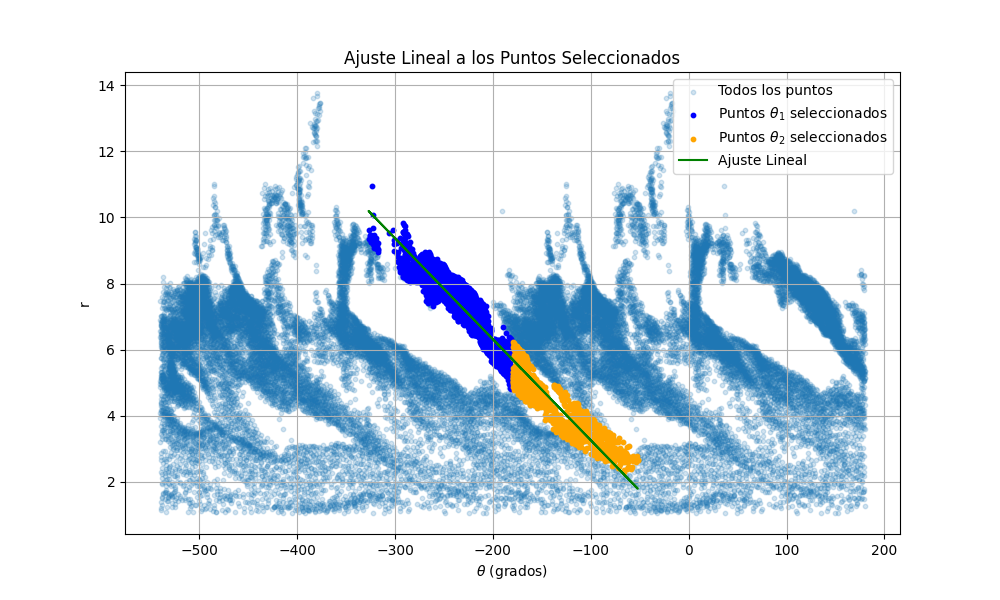

Ecuación de la recta ajustada: r = -0.0306 * θ + 0.1975


In [37]:
# Obtener los límites seleccionados
dict_lims = klicker.get_positions()

# Revisar si se seleccionaron al menos tres puntos para formar una región cerrada
if "limits" in dict_lims and len(dict_lims["limits"]) >= 3:
    # Crear un Path (camino) a partir de los puntos seleccionados
    polygon_path = Path(dict_lims["limits"])
    
    # Filtrar los puntos que están dentro del polígono seleccionado
    inside_points_theta1 = []
    inside_points_theta2 = []
    original_coords_theta1 = []  # Para almacenar las coordenadas originales de theta1
    original_coords_theta2 = []  # Para almacenar las coordenadas originales de theta2
    
    # Iterar sobre los puntos de theta1
    for i in range(len(data_theta1)):
        point = (data_theta1['theta'].iloc[i], data_theta1['r'].iloc[i])
        if polygon_path.contains_point(point):
            inside_points_theta1.append(point)
            original_coords_theta1.append((data['x'].iloc[i], data['y'].iloc[i]))

    # Iterar sobre los puntos de theta2
    for i in range(len(data_theta2)):
        point = (data_theta2['theta'].iloc[i], data_theta2['r'].iloc[i])
        if polygon_path.contains_point(point):
            inside_points_theta2.append(point)
            original_coords_theta2.append((data['x'].iloc[i], data['y'].iloc[i]))

    # Convertir los puntos seleccionados a DataFrame
    # Convertir los puntos seleccionados de theta1 a DataFrame solo si hay puntos
    if inside_points_theta1:
        selected_data_theta1 = pd.DataFrame(inside_points_theta1, columns=['theta', 'r'])
    else:
        selected_data_theta1 = pd.DataFrame({'theta': pd.Series(dtype='float64'), 
                                             'r': pd.Series(dtype='float64')})  # Crear un DataFrame vacío con las columnas necesarias

    # Convertir los puntos seleccionados de theta2 a DataFrame solo si hay puntos
    if inside_points_theta2:
        selected_data_theta2 = pd.DataFrame(inside_points_theta2, columns=['theta', 'r'])
    else:
        selected_data_theta2 = pd.DataFrame({'theta': pd.Series(dtype='float64'), 
                                             'r': pd.Series(dtype='float64')})  # Crear un DataFrame vacío con las columnas necesarias

    # Concatenar ambos para el ajuste lineal (si quieres usar todos los puntos seleccionados)
    selected_data = pd.concat([selected_data_theta1, selected_data_theta2], ignore_index=True)

    # Realizar ajuste lineal
    if len(selected_data) > 1:
        X_selected = selected_data[['theta']].values
        y_selected = selected_data['r'].values

        # Ajuste lineal
        model = LinearRegression()
        model.fit(X_selected, y_selected)
        slope = model.coef_[0]
        intercept = model.intercept_
        y_pred = model.predict(X_selected)

        # Graficar los puntos seleccionados, la línea ajustada y el fondo
        plt.figure(figsize=(10, 6))
        plt.scatter(data_combined['theta'], data_combined['r'], s=10, alpha=0.2, label='Todos los puntos')
        plt.scatter(selected_data_theta1['theta'], selected_data_theta1['r'], color='blue', s=10, label=r'Puntos $\theta_1$ seleccionados')
        plt.scatter(selected_data_theta2['theta'], selected_data_theta2['r'], color='orange', s=10, label=r'Puntos $\theta_2$ seleccionados')
        plt.plot(selected_data['theta'], y_pred, color='green', label='Ajuste Lineal')
        plt.title("Ajuste Lineal a los Puntos Seleccionados")
        plt.xlabel(r'$\theta$ (grados)')
        plt.ylabel('r')
        plt.legend()
        plt.grid(True)
        plt.show()

        # Mostrar la ecuación de la recta
        print(f"Ecuación de la recta ajustada: r = {slope:.4f} * θ + {intercept:.4f}")
    else:
        print("Selecciona más puntos para realizar el ajuste.")
else:
    print("Selecciona al menos tres puntos para definir una región cerrada.")

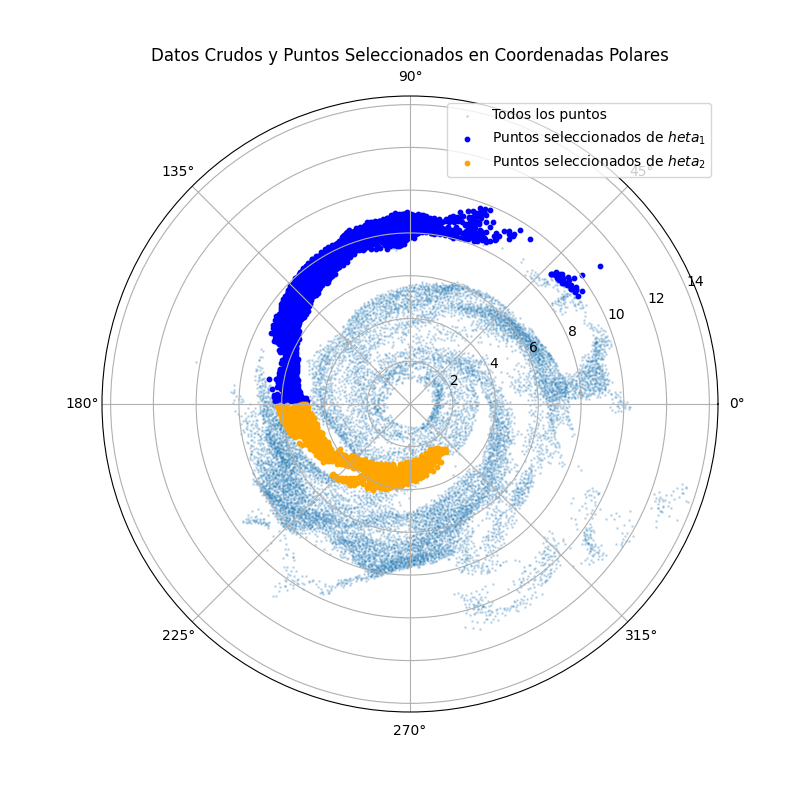

In [38]:
# Extraer las coordenadas originales x e y de los puntos seleccionados
selected_x_theta1 = [coord[0] for coord in original_coords_theta1]
selected_y_theta1 = [coord[1] for coord in original_coords_theta1]
selected_x_theta2 = [coord[0] for coord in original_coords_theta2]
selected_y_theta2 = [coord[1] for coord in original_coords_theta2]

# Configurar la gráfica en coordenadas polares
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(8, 8))

# Graficar todos los puntos en coordenadas polares
theta_all = np.arctan2(data['y'], data['x'])
r_all = np.sqrt(data['x']**2 + data['y']**2)
ax.scatter(theta_all, r_all, s=1, alpha=0.2, label="Todos los puntos")

# Graficar los puntos seleccionados de theta1 en azul
theta_selected_theta1 = np.arctan2(selected_y_theta1, selected_x_theta1)
r_selected_theta1 = np.sqrt(np.array(selected_x_theta1)**2 + np.array(selected_y_theta1)**2)
ax.scatter(theta_selected_theta1, r_selected_theta1, color='blue', s=10, label="Puntos seleccionados de $\theta_1$")

# Graficar los puntos seleccionados de theta2 en naranja
theta_selected_theta2 = np.arctan2(selected_y_theta2, selected_x_theta2)
r_selected_theta2 = np.sqrt(np.array(selected_x_theta2)**2 + np.array(selected_y_theta2)**2)
ax.scatter(theta_selected_theta2, r_selected_theta2, color='orange', s=10, label="Puntos seleccionados de $\theta_2$")

# Configuración de la gráfica
ax.set_title("Datos Crudos y Puntos Seleccionados en Coordenadas Polares")
ax.legend()
plt.show()